# Etude du DF total

## Importer les librairies

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re


### Obtenir l'info complète du DF

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
#pd.set_option('display.max_colwidth', None)

## Importer le DF

In [3]:
df= pd.read_csv("gaming_total_v2.csv", index_col=0)
df.head()

,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,developpeur_goo,PEGI_goo,developpeur_wiki,PEGI_wiki,Meta_NP,Meta_VP,Meta_NUsers,Meta_VUsers,meta_score,user_review,Rank,test_note_JVC,avis_count_JVC,avis_note_JVC,Classification_Age_JVC,max_joueurs_JVC,Support_JVC,langue_parlée_JVC,texte_JVC,nb_joueurs_JVC,game_mode,game_mode_JVC
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,Nintendo,NaN,Nintendo EAD,7.0,76.0,51.0,8.1,539.0,76.0,8.1,1.0,14.0,687.0,13.8,7.0,4.0,DVD,français,français,4.0,2.0,NaN
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,84.0,14.0,8.4,119.0,NaN,NaN,NaN,19.0,3.0,19.0,3.0,NaN,eShop Console Virtuelle Cartouche,NaN,NaN,NaN,NaN,1.0
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,NaN,NaN,Nintendo EAD,3.0,82.0,73.0,8.5,1167.0,82.0,8.4,3.0,16.0,3023.0,17.4,3.0,4.0,DVD,NaN,NaN,4.0,2.0,2.0
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,Nintendo,NaN,NaN,NaN,80.0,73.0,8.3,346.0,80.0,8.2,4.0,15.0,581.0,16.5,3.0,4.0,DVD,français,français,4.0,NaN,NaN
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# EDA (Analyse Exploratoire des Données):
## Analyse de la forme: 

In [4]:
df.shape

(16628, 32)

## Suppression des variables non exploitables et des lignes en double

<Axes: >

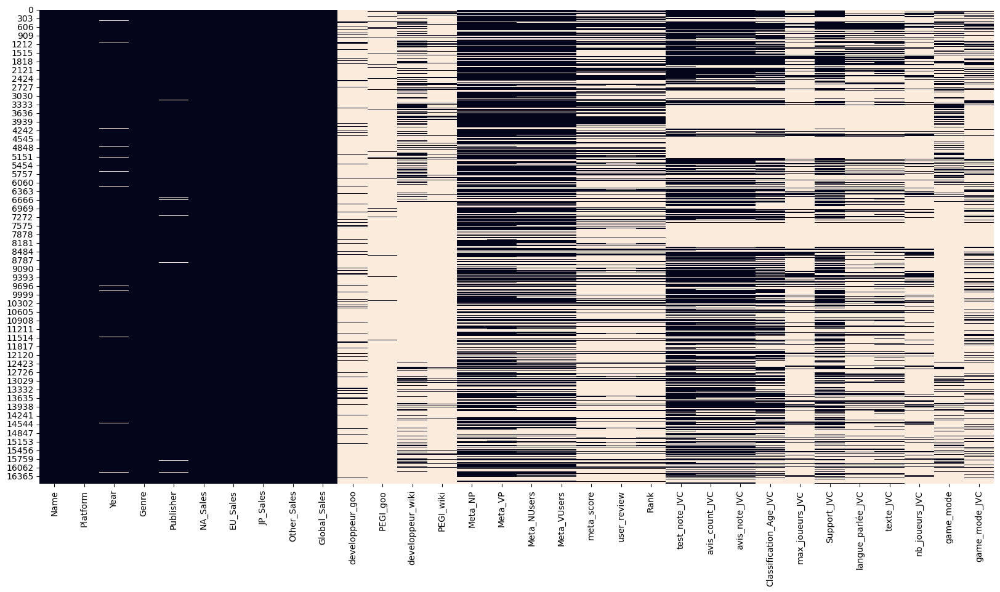

In [5]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)
# donne une image du datset en entier pour avoir un aperçu des Nans

In [6]:
df= df.drop_duplicates()

In [7]:
df.shape

(16628, 32)

## Nombre de modalités pour chaques variables

In [8]:
for col in df.columns:
   print(col,':' ,df[col].nunique())

Name : 11493
Platform : 31
Year : 39
Genre : 12
Publisher : 578
NA_Sales : 409
EU_Sales : 305
JP_Sales : 244
Other_Sales : 157
Global_Sales : 623
developpeur_goo : 527
PEGI_goo : 8
developpeur_wiki : 977
PEGI_wiki : 5
Meta_NP : 84
Meta_VP : 113
Meta_NUsers : 89
Meta_VUsers : 1111
meta_score : 78
user_review : 81
Rank : 5163
test_note_JVC : 19
avis_count_JVC : 546
avis_note_JVC : 181
Classification_Age_JVC : 8
max_joueurs_JVC : 20
Support_JVC : 531
langue_parlée_JVC : 3
texte_JVC : 3
nb_joueurs_JVC : 20
game_mode : 2
game_mode_JVC : 2


In [9]:
print('Data Types:')
print(df.dtypes)

Data Types:
Name                       object
Platform                   object
Year                      float64
Genre                      object
Publisher                  object
NA_Sales                  float64
EU_Sales                  float64
JP_Sales                  float64
Other_Sales               float64
Global_Sales              float64
developpeur_goo            object
PEGI_goo                  float64
developpeur_wiki           object
PEGI_wiki                 float64
Meta_NP                   float64
Meta_VP                   float64
Meta_NUsers               float64
Meta_VUsers               float64
meta_score                float64
user_review               float64
Rank                      float64
test_note_JVC             float64
avis_count_JVC            float64
avis_note_JVC             float64
Classification_Age_JVC    float64
max_joueurs_JVC           float64
Support_JVC                object
langue_parlée_JVC          object
texte_JVC                  object
nb

### Type de variables

In [10]:
df.dtypes.value_counts()

float64    23
object      9
dtype: int64

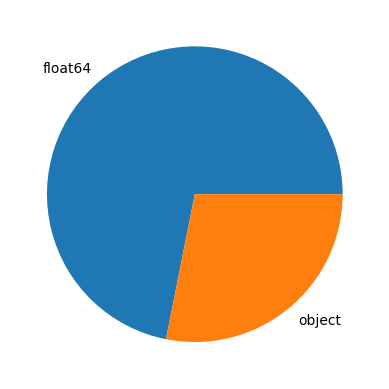

In [11]:
df.dtypes.value_counts().plot.pie(autopct=lambda x: f'{str(round(x, 2))}%')

In [12]:
print(df.isna().sum())


Name                          0
Platform                      0
Year                        270
Genre                         0
Publisher                    58
NA_Sales                      0
EU_Sales                      0
JP_Sales                      0
Other_Sales                   0
Global_Sales                  0
developpeur_goo           15128
PEGI_goo                  16142
developpeur_wiki          13533
PEGI_wiki                 15545
Meta_NP                    5796
Meta_VP                    5766
Meta_NUsers                6670
Meta_VUsers                6670
meta_score                11434
user_review               11739
Rank                      11434
test_note_JVC              6596
avis_count_JVC             7495
avis_note_JVC              7495
Classification_Age_JVC     9517
max_joueurs_JVC           14062
Support_JVC                9259
langue_parlée_JVC         12666
texte_JVC                 12012
nb_joueurs_JVC            14062
game_mode                 13791
game_mod

In [13]:
print("Pourcentage de valeurs nulles:")
(df.isna().sum()/df.shape[0]).sort_values(ascending=True).round(2)*100

Pourcentage de valeurs nulles:


Name                       0.0
Platform                   0.0
Genre                      0.0
NA_Sales                   0.0
EU_Sales                   0.0
JP_Sales                   0.0
Other_Sales                0.0
Global_Sales               0.0
Publisher                  0.0
Year                       2.0
Meta_VP                   35.0
Meta_NP                   35.0
test_note_JVC             40.0
Meta_NUsers               40.0
Meta_VUsers               40.0
avis_count_JVC            45.0
avis_note_JVC             45.0
Support_JVC               56.0
Classification_Age_JVC    57.0
meta_score                69.0
Rank                      69.0
user_review               71.0
texte_JVC                 72.0
langue_parlée_JVC         76.0
game_mode_JVC             76.0
developpeur_wiki          81.0
game_mode                 83.0
max_joueurs_JVC           85.0
nb_joueurs_JVC            85.0
developpeur_goo           91.0
PEGI_wiki                 93.0
PEGI_goo                  97.0
dtype: f

In [14]:
cat_data = df.select_dtypes(include=['object'])
num_data = df.select_dtypes(include=['int64', 'float64'])
 
print('Variables catégorielles :', cat_data.columns)
print('Variables numériques :', num_data.columns)

Variables catégorielles : Index(['Name', 'Platform', 'Genre', 'Publisher', 'developpeur_goo',
       'developpeur_wiki', 'Support_JVC', 'langue_parlée_JVC', 'texte_JVC'],
      dtype='object')
Variables numériques : Index(['Year', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales',
       'Global_Sales', 'PEGI_goo', 'PEGI_wiki', 'Meta_NP', 'Meta_VP',
       'Meta_NUsers', 'Meta_VUsers', 'meta_score', 'user_review', 'Rank',
       'test_note_JVC', 'avis_count_JVC', 'avis_note_JVC',
       'Classification_Age_JVC', 'max_joueurs_JVC', 'nb_joueurs_JVC',
       'game_mode', 'game_mode_JVC'],
      dtype='object')


In [15]:
print("Nombre de colonne avec moins de 90% de valeurs nulles :",df.columns[df.isna().sum()/df.shape[0] >0.9].value_counts().sum())
print(df.columns[df.isna().sum()/df.shape[0] >0.9].value_counts())

Nombre de colonne avec moins de 90% de valeurs nulles : 3
developpeur_goo    1
PEGI_goo           1
PEGI_wiki          1
dtype: int64


## Conclusion Analyse de la forme: 
- Identification de la target : "Global_Sales"
- Nb de lignes et de colonnes : 16628, 32
- Types de variables : object -> 9, float64 -> 23
- Identification des Nans : 3 colonnes avec 90% de valeurs nulles

## Analyse de fond:

### Analyse de la variable cible

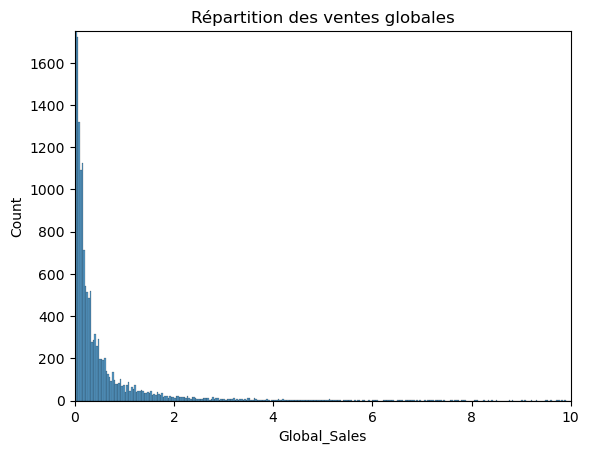

In [16]:
plt.figure()
plt.xlim(0,10)
plt.ylim(0,1750)
sns.histplot(num_data['Global_Sales'])
plt.title("Répartition des ventes globales");

### Analyse des variables numériques

C:\Users\debor\AppData\Local\Temp\ipykernel_67476\3205538130.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_data[col], label=col)
C:\Users\debor\AppData\Local\Temp\ipykernel_67476\3205538130.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_data[col], label=col)
C:\Users\debor\App

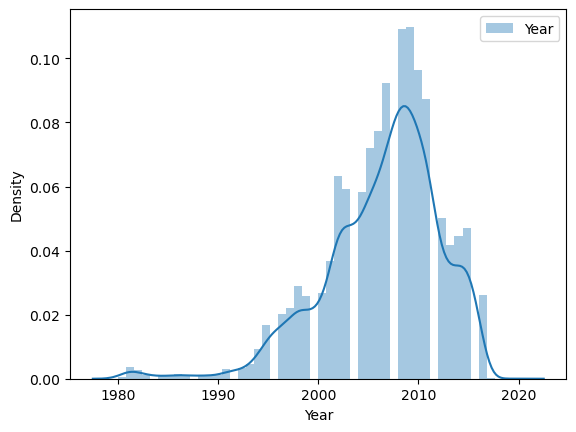

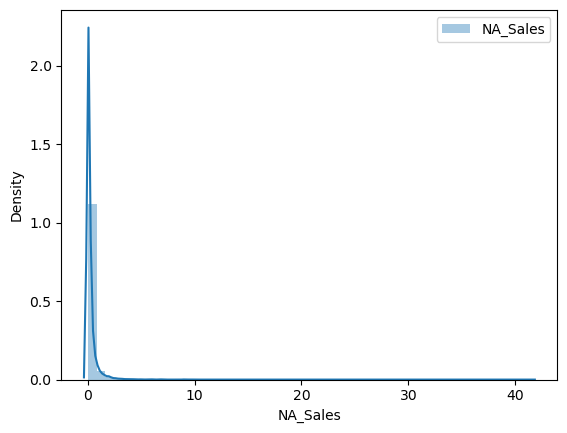

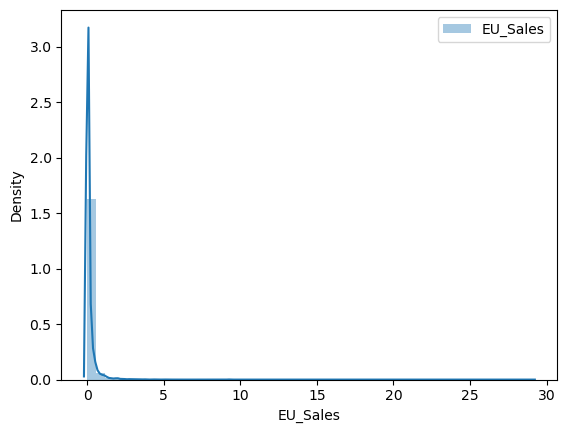

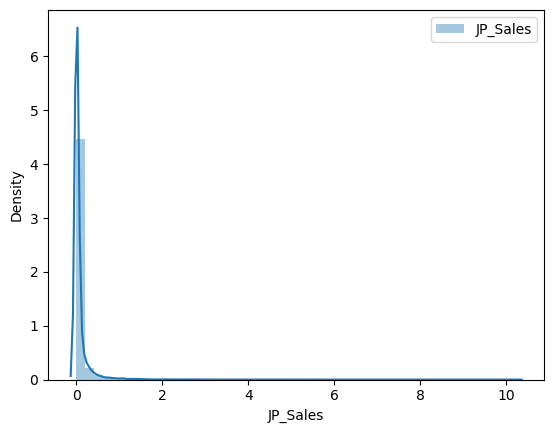

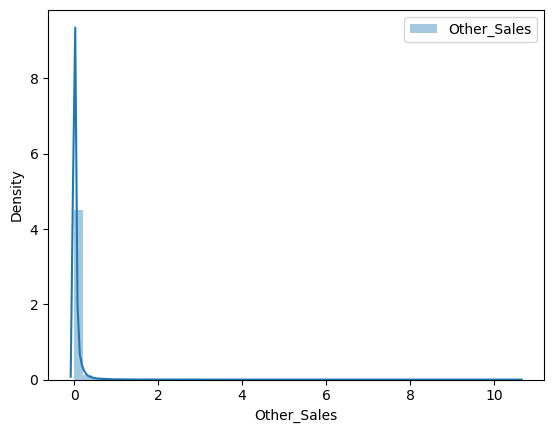

...

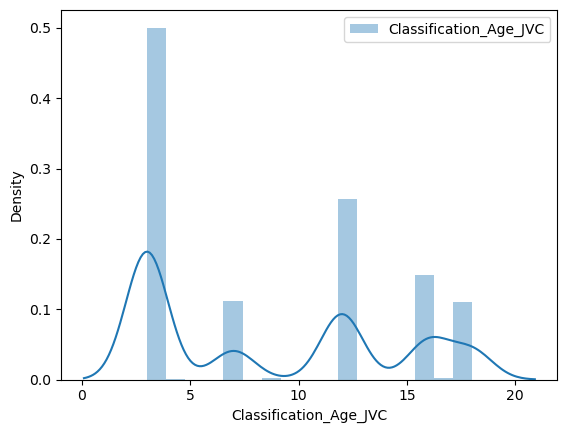

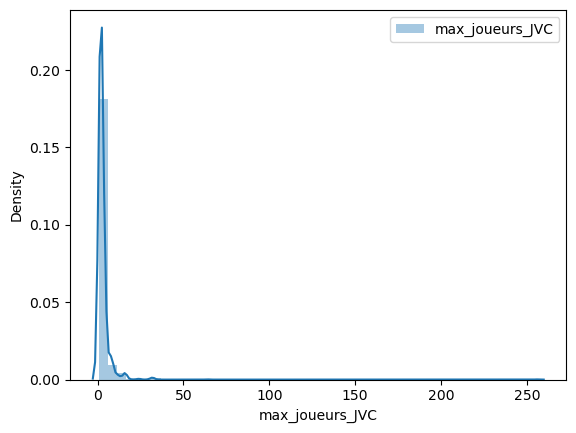

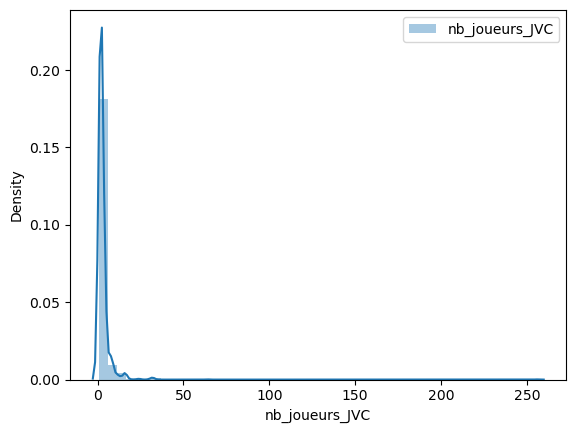

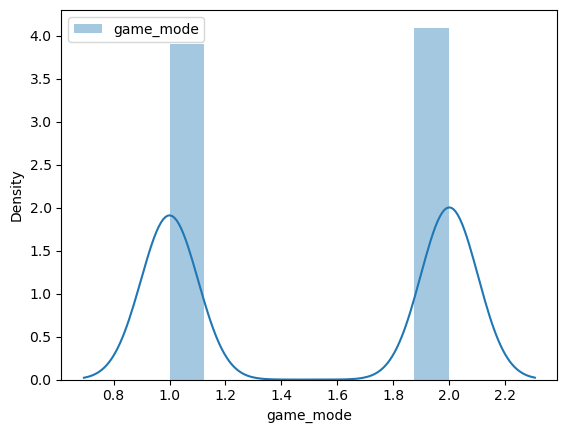

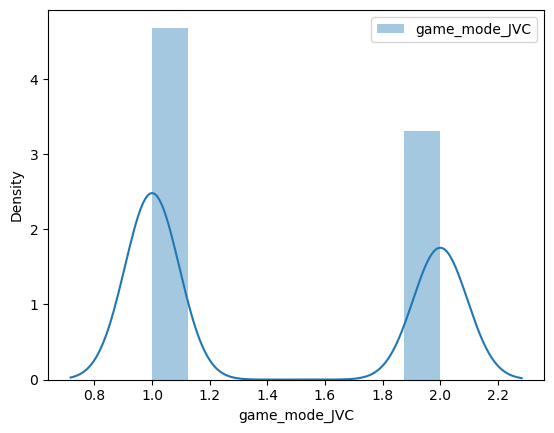

In [17]:
for col in num_data:
    plt.figure()
    sns.distplot(num_data[col], label=col)
    #sns.distplot(df['Global_Sales'], label= 'Global_Sales')
    plt.legend()

### Analyse des Variables qualitatives

In [18]:
for col in cat_data:
    print(f'{col :-<50} {cat_data[col].unique()}')

Name---------------------------------------------- ['Wii Sports' 'Super Mario Bros.' 'Mario Kart Wii' ... 'Plushees'
 'Woody Woodpecker in Crazy Castle 5' 'Know How 2']
Platform------------------------------------------ ['Wii' 'NES' 'GB' 'DS' 'X360' 'PS3' 'PS2' 'SNES' 'GBA' '3DS' 'PS4' 'N64'
 'PS' 'XB' 'PC' '2600' 'PSP' 'XOne' 'GC' 'WiiU' 'GEN' 'DC' 'PSV' 'SAT'
 'SCD' 'WS' 'NG' 'TG16' '3DO' 'GG' 'PCFX']
Genre--------------------------------------------- ['Sports' 'Platform' 'Racing' 'Role-Playing' 'Puzzle' 'Misc' 'Shooter'
 'Simulation' 'Action' 'Fighting' 'Adventure' 'Strategy']
Publisher----------------------------------------- ['Nintendo' 'Microsoft Game Studios' 'Take-Two Interactive'
 'Sony Computer Entertainment' 'Activision' 'Ubisoft' 'Bethesda Softworks'
 'Electronic Arts' 'Sega' 'SquareSoft' 'Atari' '505 Games' 'Capcom'
 'GT Interactive' 'Konami Digital Entertainment'
 'Sony Computer Entertainment Europe' 'Square Enix' 'LucasArts'
 'Virgin Interactive' 'Warner Bros. Interactiv

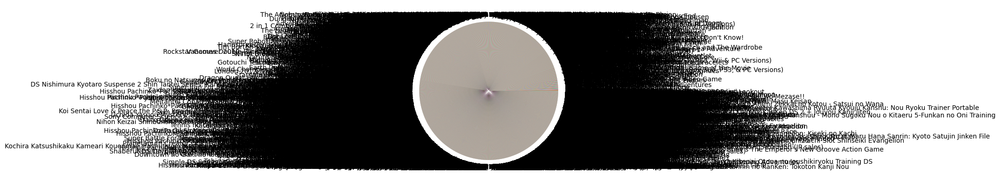

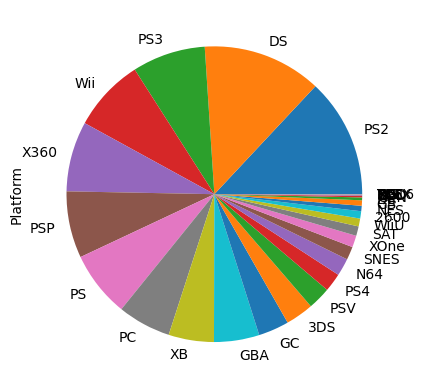

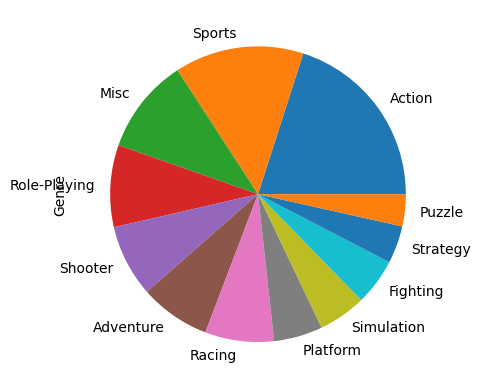

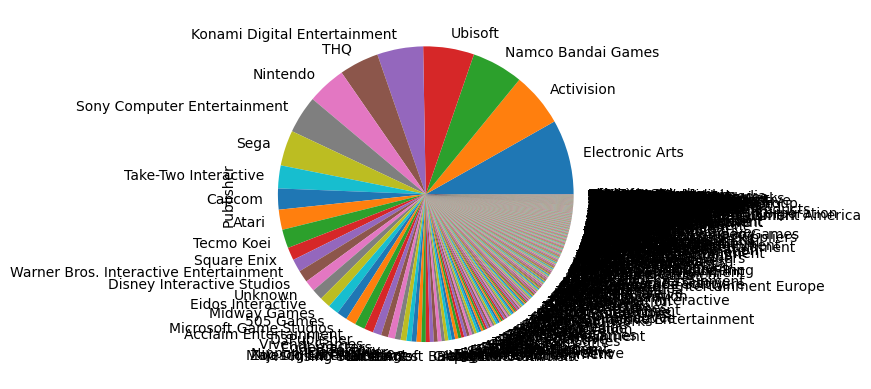

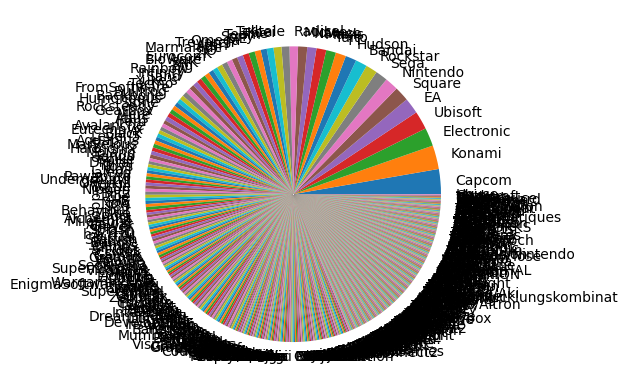

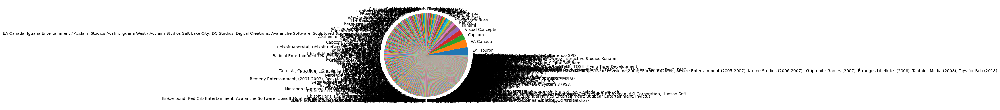

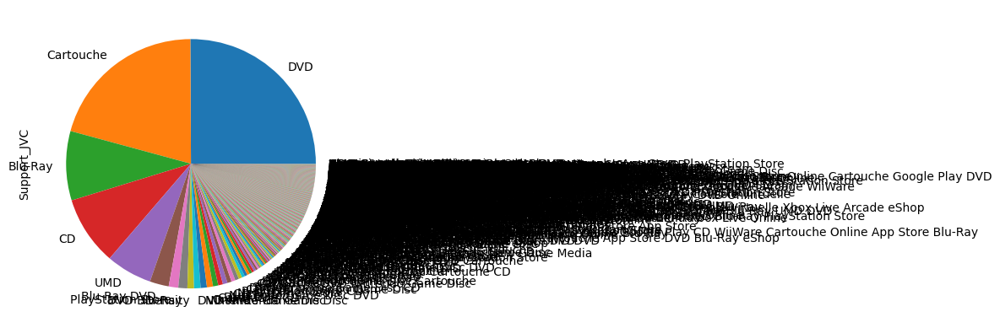

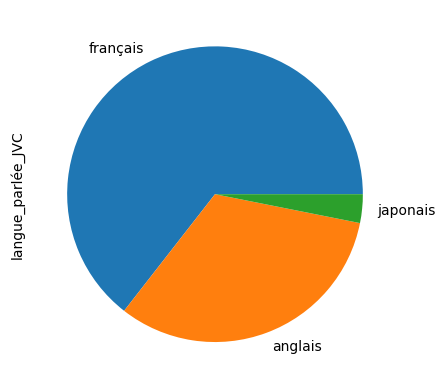

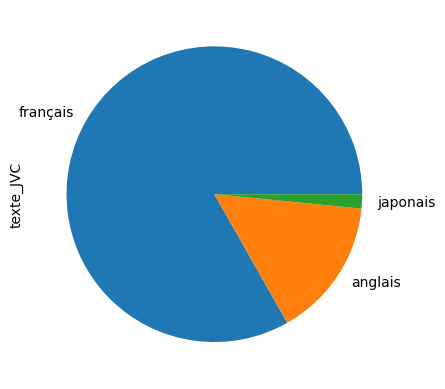

In [19]:
for col in cat_data:
    plt.figure()
    cat_data[col].value_counts().plot.pie(autopct=lambda x: f'{str(round(x, 2))}%')
    

### Relation Target / variables catégorielles

c:\Users\debor\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
C:\Users\debor\AppData\Local\Temp\ipykernel_67476\18815425.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()
c:\Users\debor\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\debor\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. The left and

<Figure size 640x480 with 0 Axes>

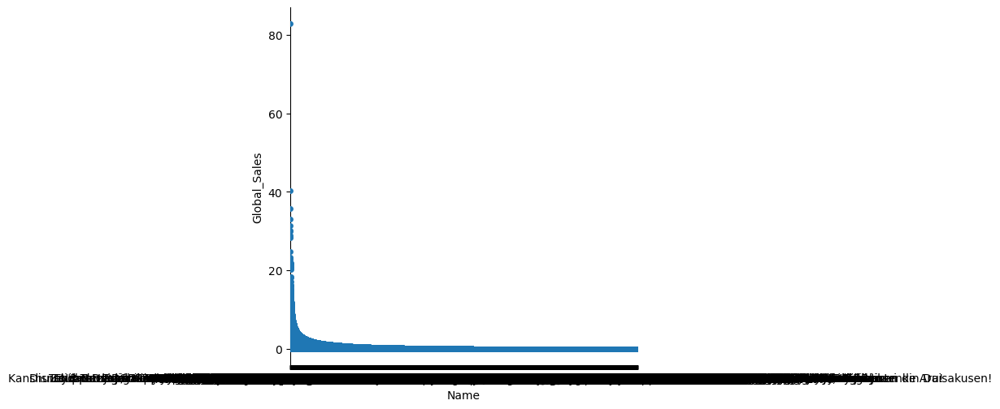

<Figure size 640x480 with 0 Axes>

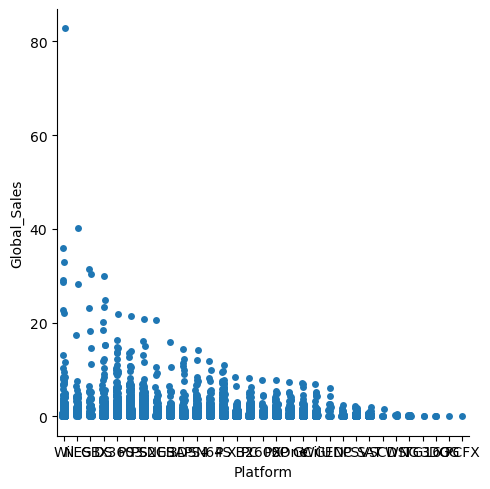

<Figure size 640x480 with 0 Axes>

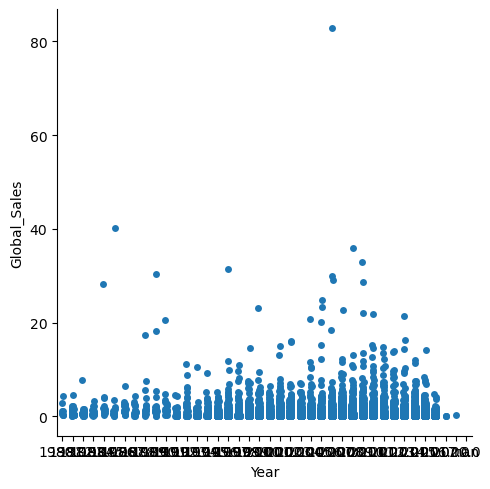

<Figure size 640x480 with 0 Axes>

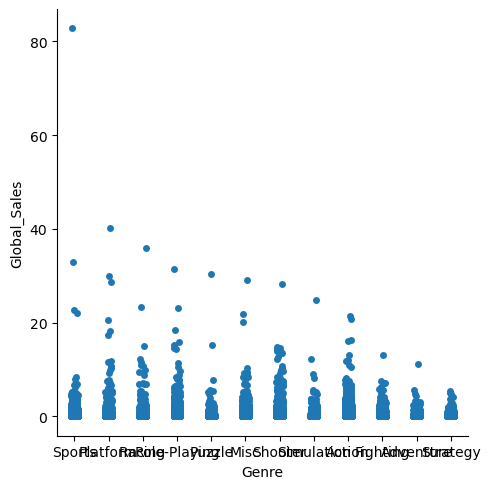

<Figure size 640x480 with 0 Axes>

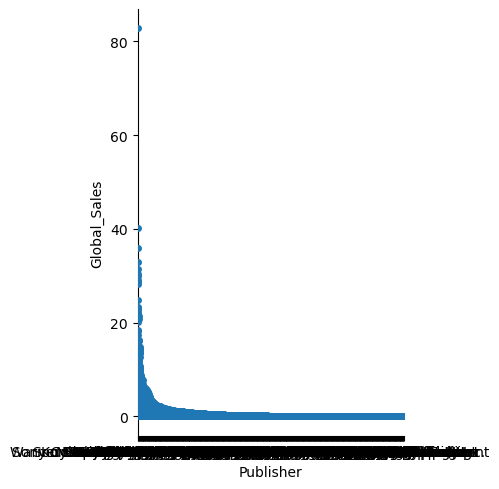

<Figure size 640x480 with 0 Axes>

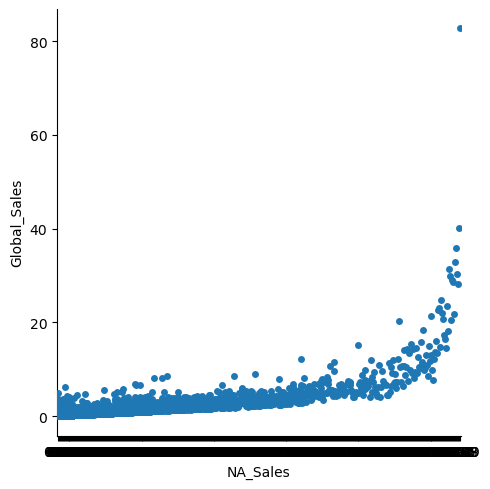

<Figure size 640x480 with 0 Axes>

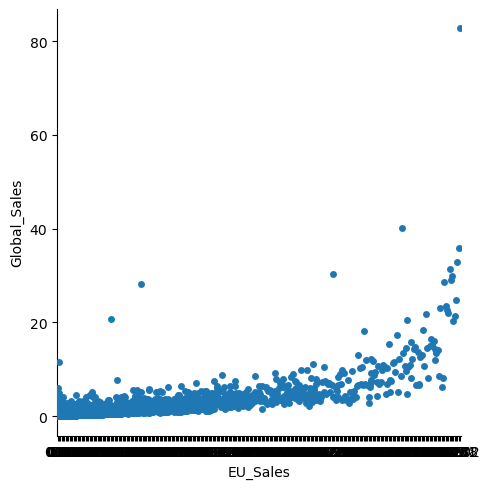

<Figure size 640x480 with 0 Axes>

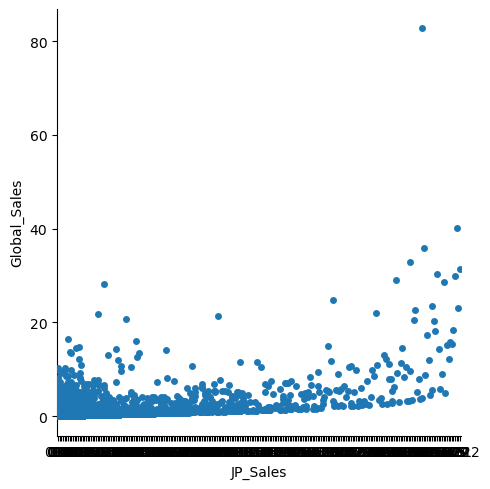

<Figure size 640x480 with 0 Axes>

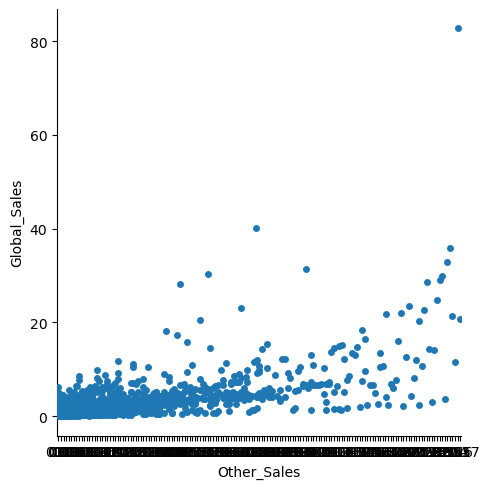

<Figure size 640x480 with 0 Axes>

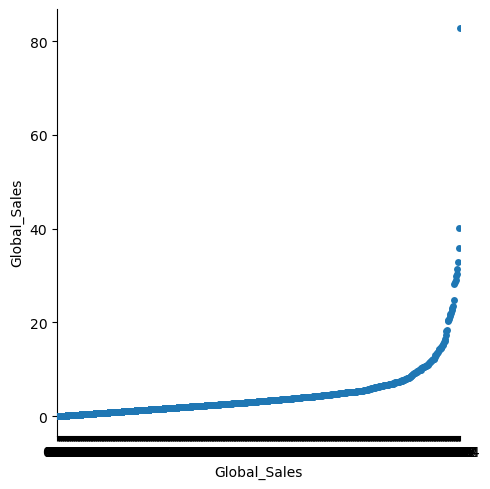

<Figure size 640x480 with 0 Axes>

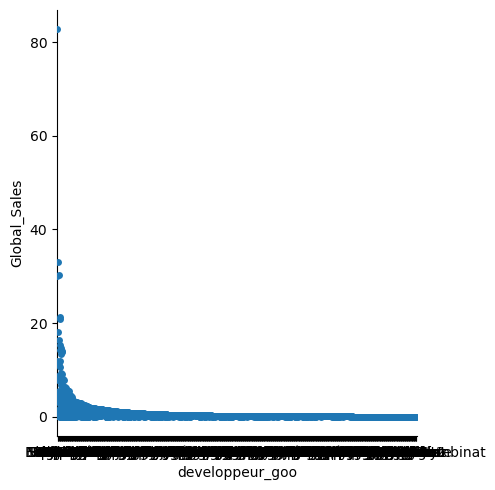

<Figure size 640x480 with 0 Axes>

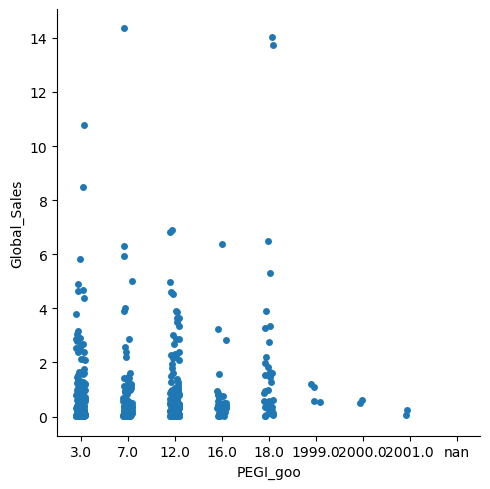

<Figure size 640x480 with 0 Axes>

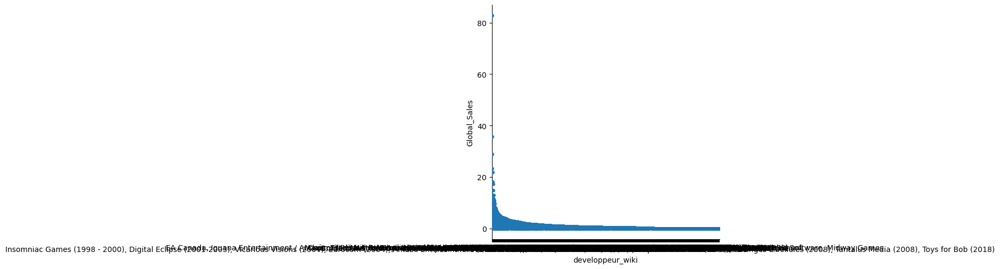

<Figure size 640x480 with 0 Axes>

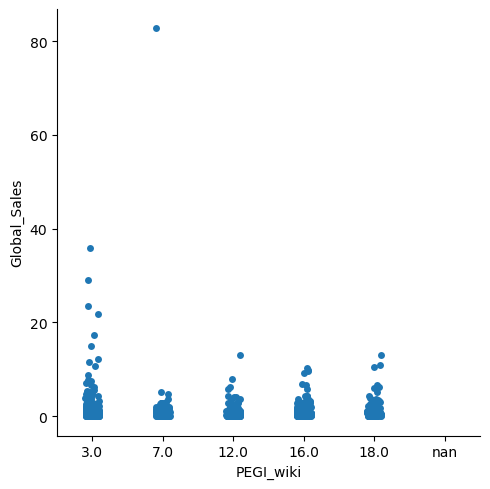

<Figure size 640x480 with 0 Axes>

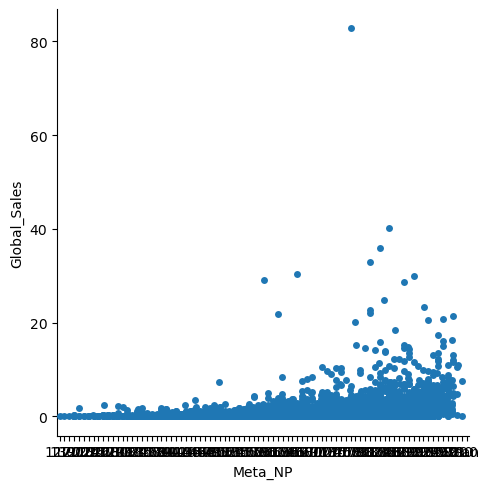

<Figure size 640x480 with 0 Axes>

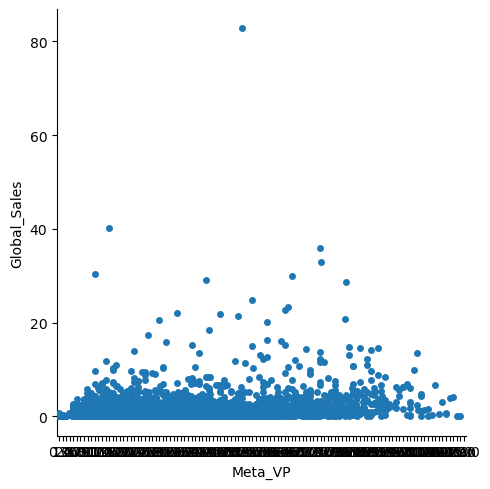

<Figure size 640x480 with 0 Axes>

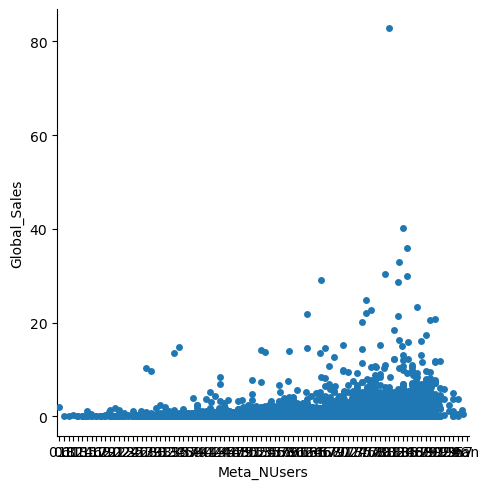

<Figure size 640x480 with 0 Axes>

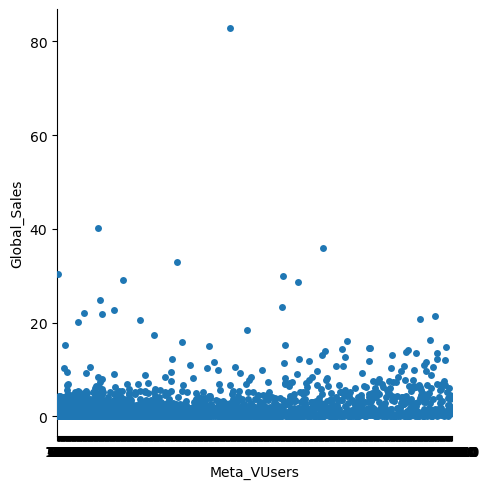

<Figure size 640x480 with 0 Axes>

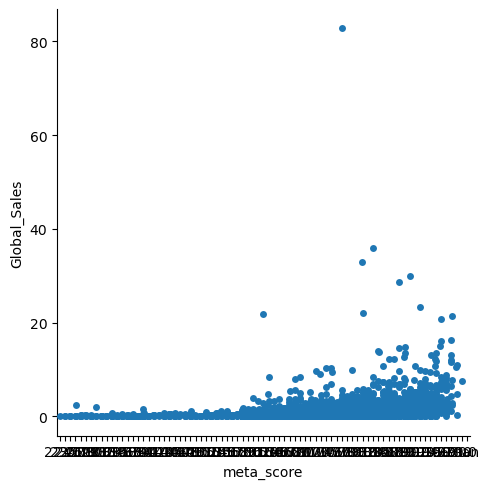

<Figure size 640x480 with 0 Axes>

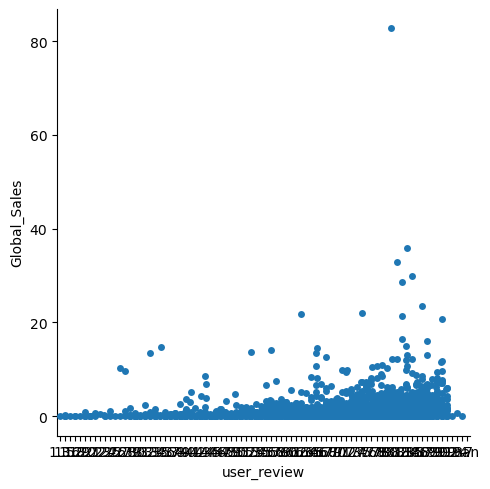

<Figure size 640x480 with 0 Axes>

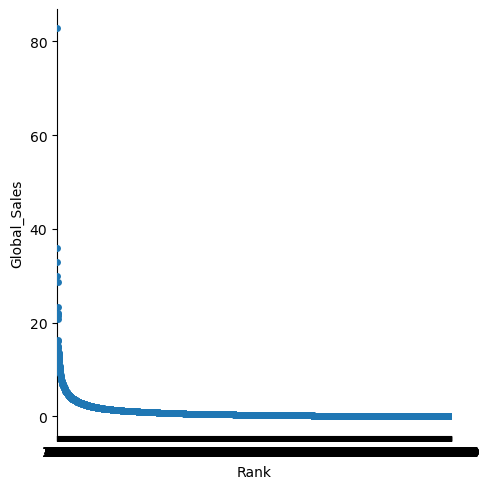

<Figure size 640x480 with 0 Axes>

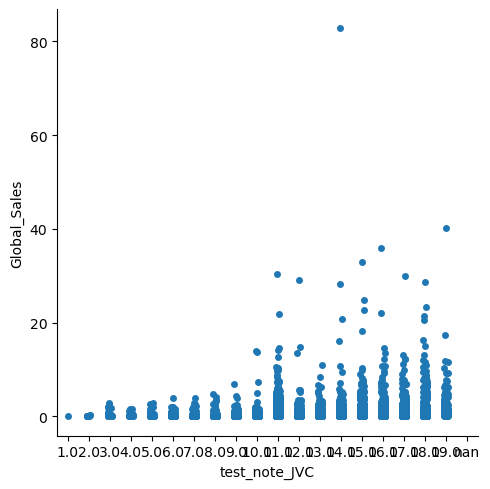

<Figure size 640x480 with 0 Axes>

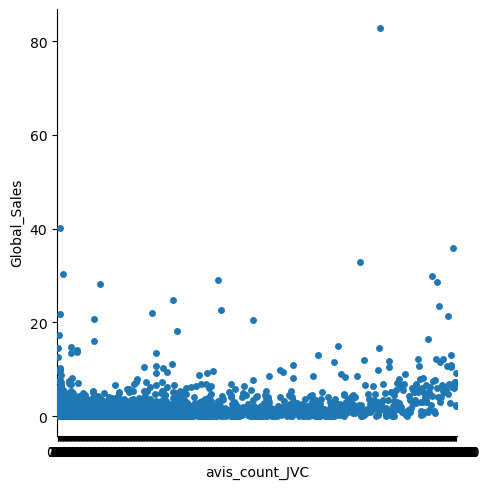

<Figure size 640x480 with 0 Axes>

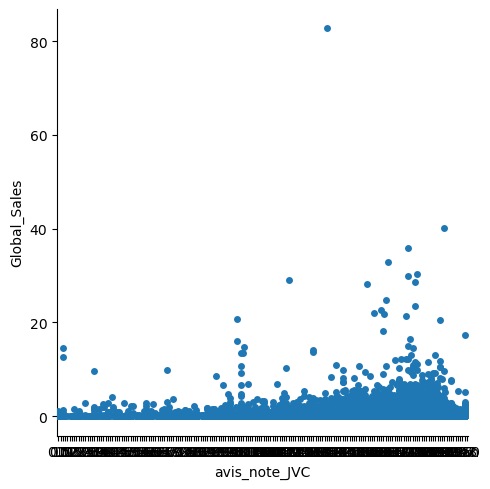

<Figure size 640x480 with 0 Axes>

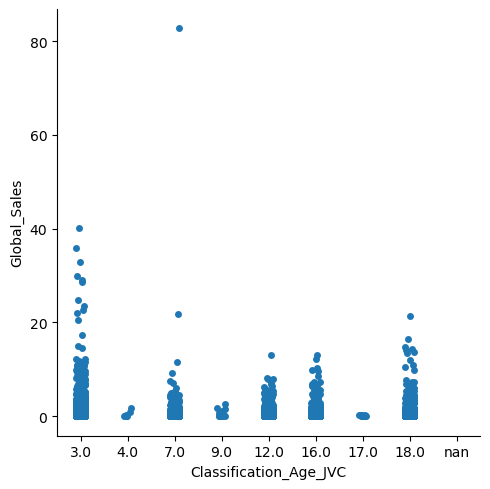

<Figure size 640x480 with 0 Axes>

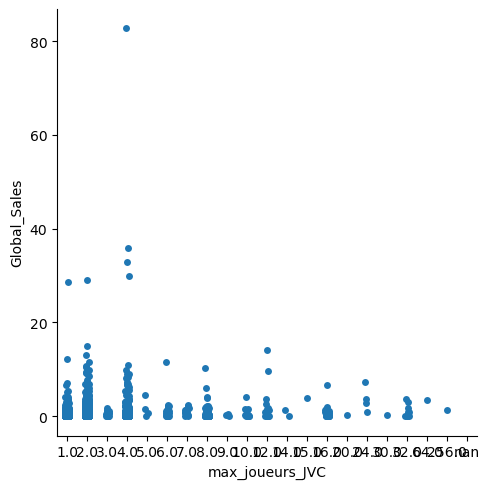

<Figure size 640x480 with 0 Axes>

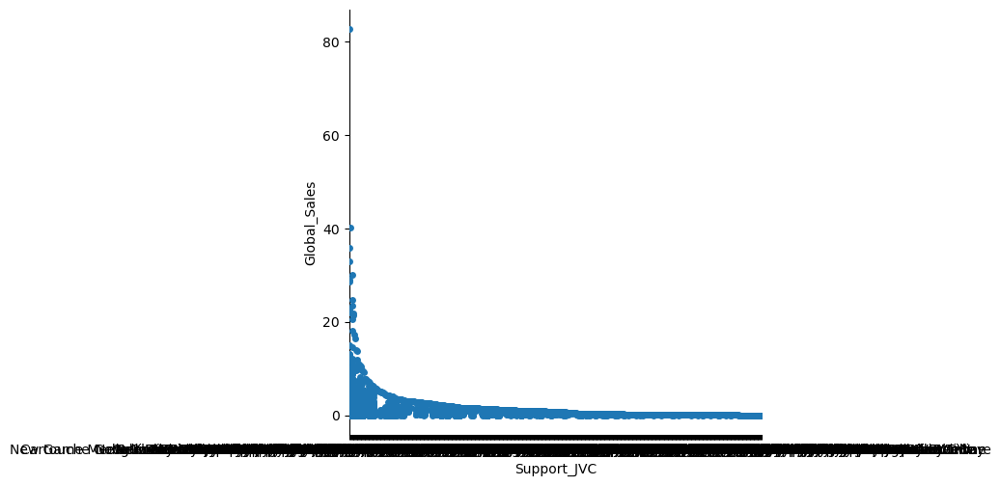

<Figure size 640x480 with 0 Axes>

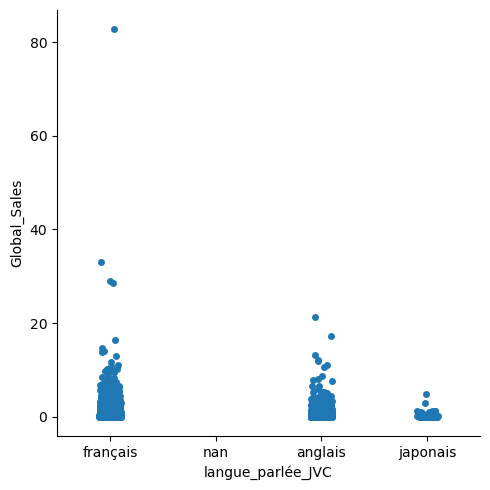

<Figure size 640x480 with 0 Axes>

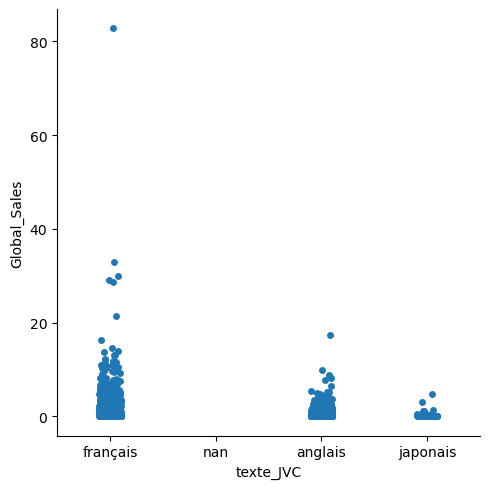

<Figure size 640x480 with 0 Axes>

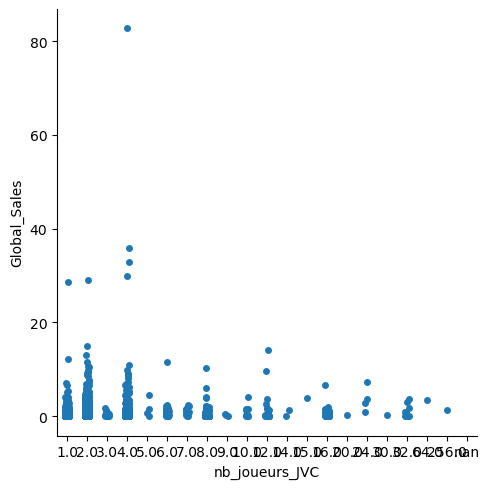

<Figure size 640x480 with 0 Axes>

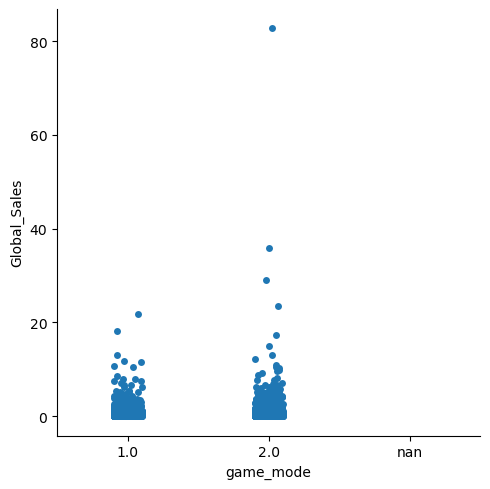

<Figure size 640x480 with 0 Axes>

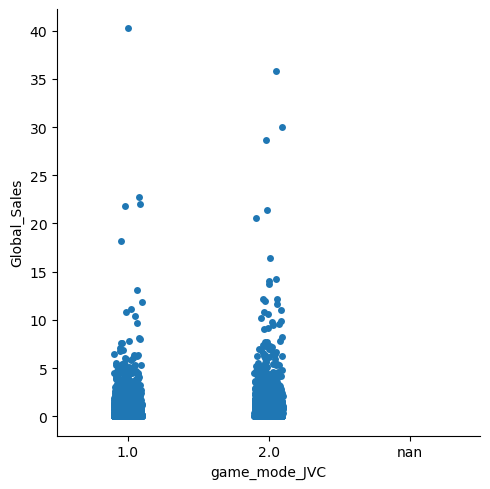

In [20]:
for col in df:
    plt.figure()
    sns.catplot(data=df, x=df[col], y="Global_Sales")


C:\Users\debor\AppData\Local\Temp\ipykernel_67476\2218410642.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=False)


<Axes: >

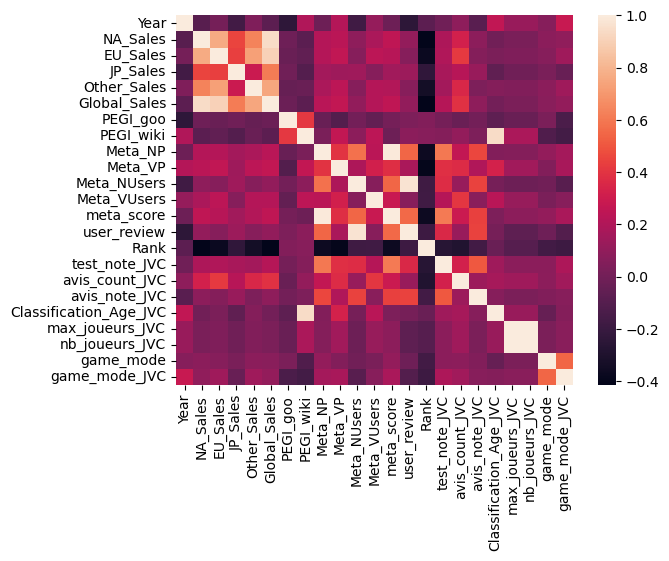

In [21]:
sns.heatmap(df.corr(),annot=False)

In [22]:
df['Global_Sales_group']=pd.qcut(df['Global_Sales'], q=4)

<Axes: xlabel='Global_Sales_group', ylabel='count'>

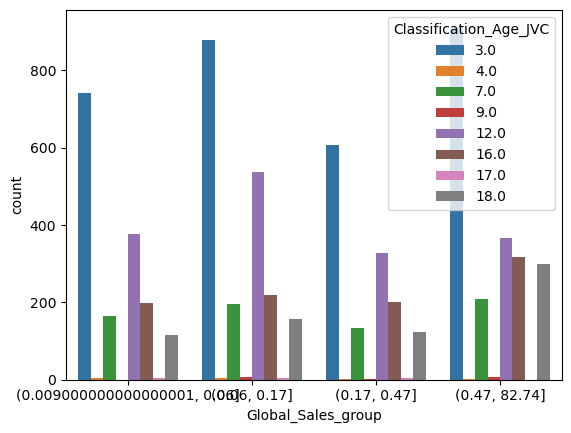

In [23]:
plt.figure()
sns.countplot(x='Global_Sales_group', hue="Classification_Age_JVC", data=df)

In [24]:
pd.crosstab(df['Global_Sales_group'], df['Classification_Age_JVC'], normalize=True)


Classification_Age_JVC,3.0,4.0,7.0,9.0,12.0,16.0,17.0,18.0
Global_Sales_group,,,,,,,,
"(0.009000000000000001, 0.06]",0.104345,0.000422,0.023203,0.000000,0.053016,0.027985,0.000422,0.016313
"(0.06, 0.17]",0.123611,0.000422,0.027422,0.000844,0.075657,0.030657,0.000422,0.022078
"(0.17, 0.47]",0.085361,0.000141,0.018844,0.000141,0.045985,0.028125,0.000563,0.017438
"(0.47, 82.74]",0.128111,0.000281,0.029250,0.000844,0.051610,0.044438,0.000000,0.042048


C:\Users\debor\AppData\Local\Temp\ipykernel_67476\4282069791.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


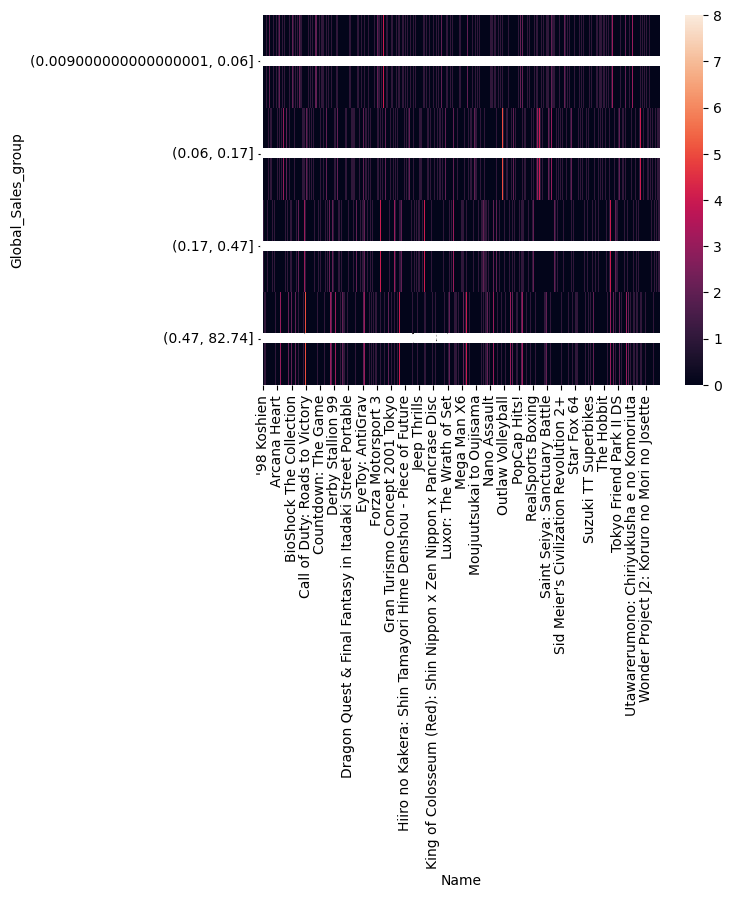

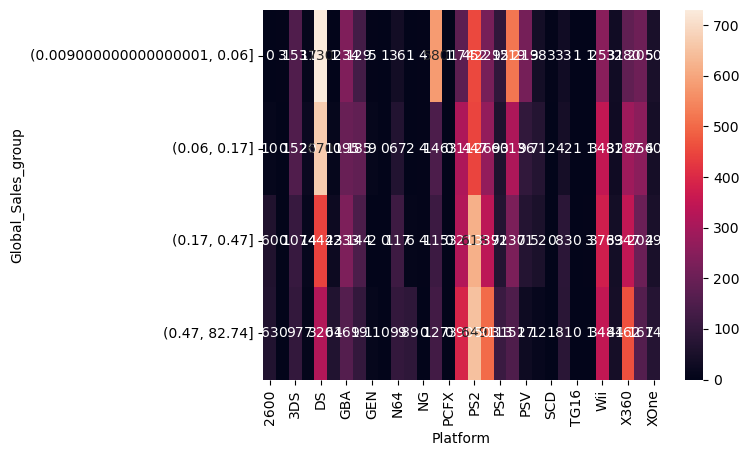

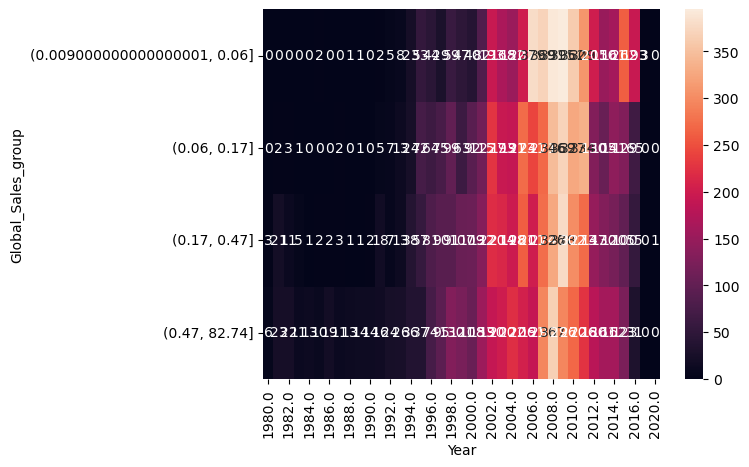

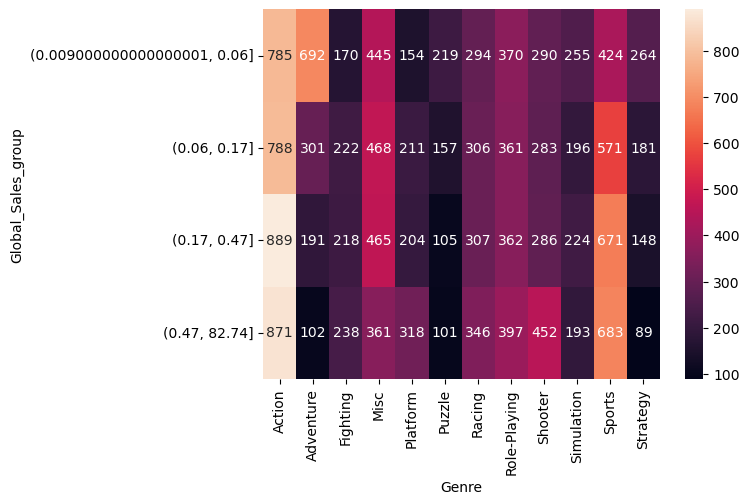

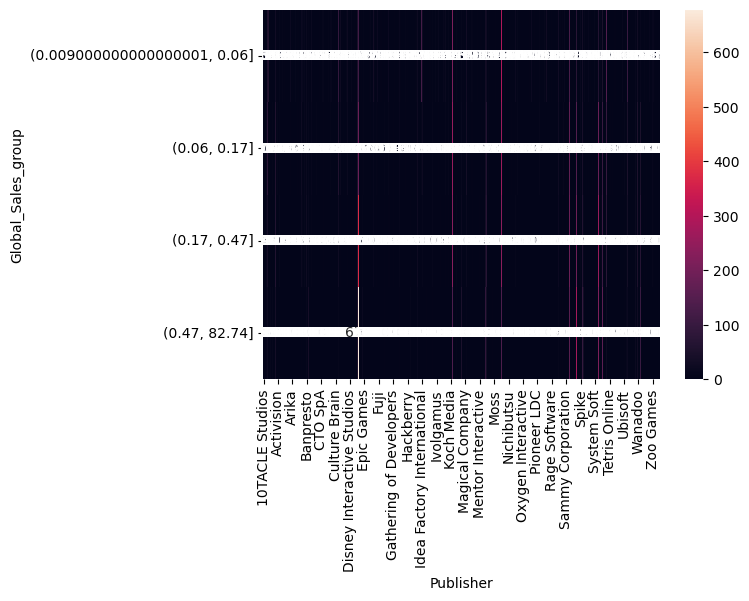

...

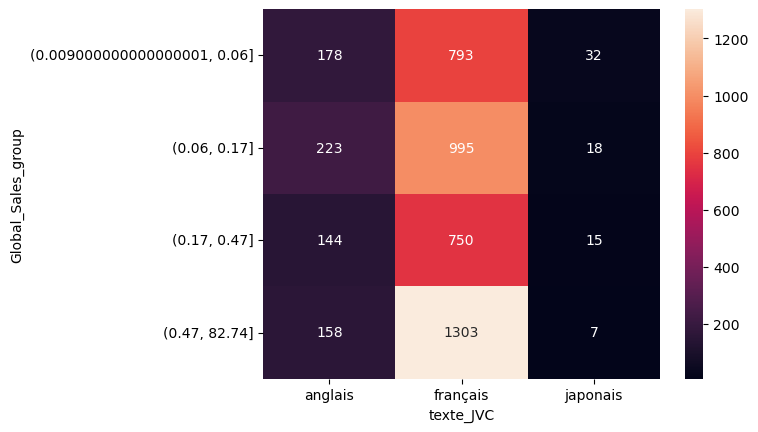

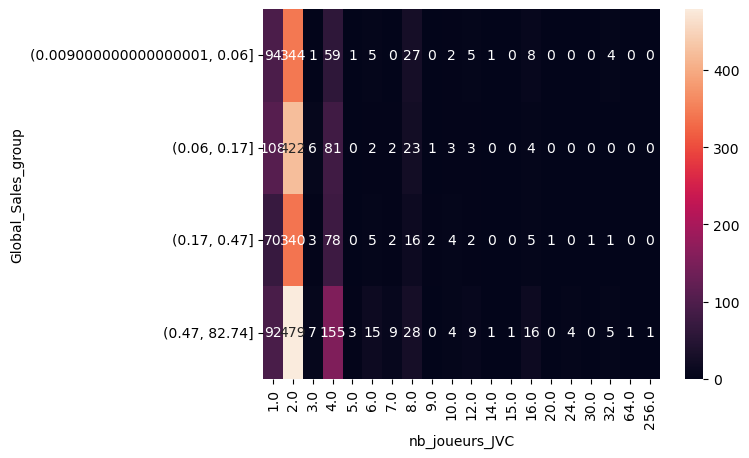

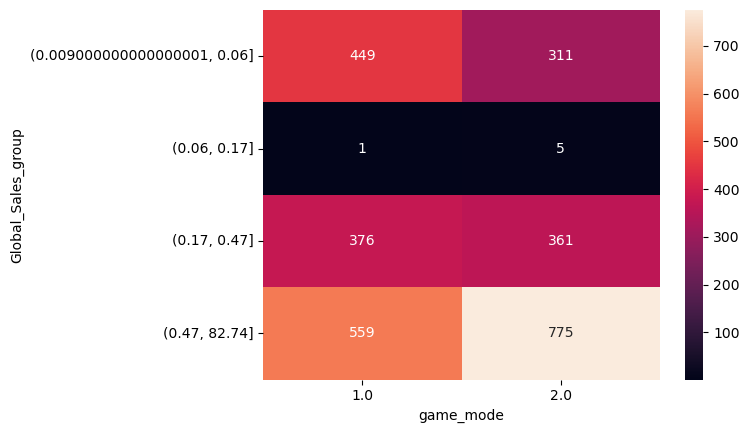

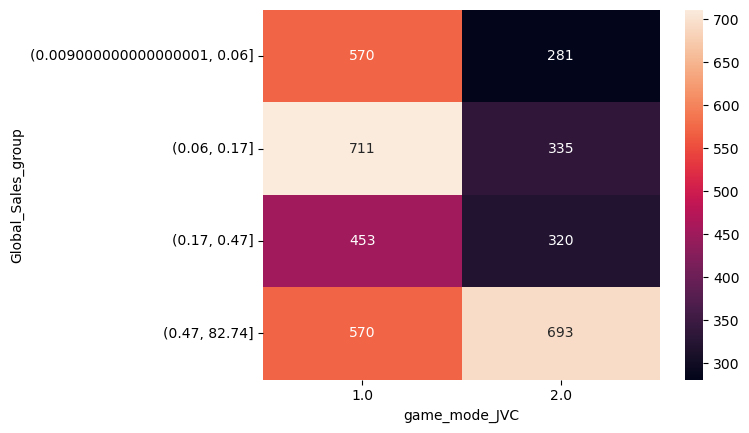

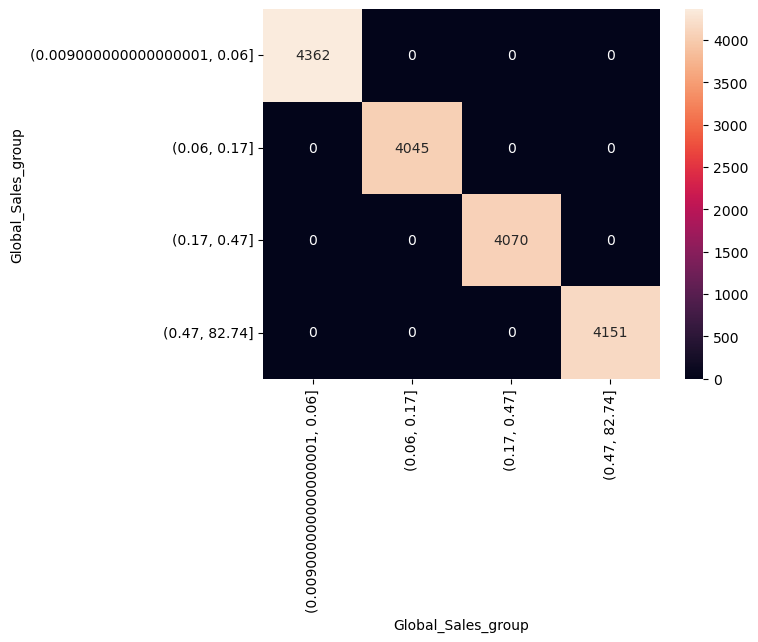

In [25]:
for col in df:
    plt.figure()
    sns.heatmap(pd.crosstab(df['Global_Sales_group'], df[col]), annot=True, fmt='d')

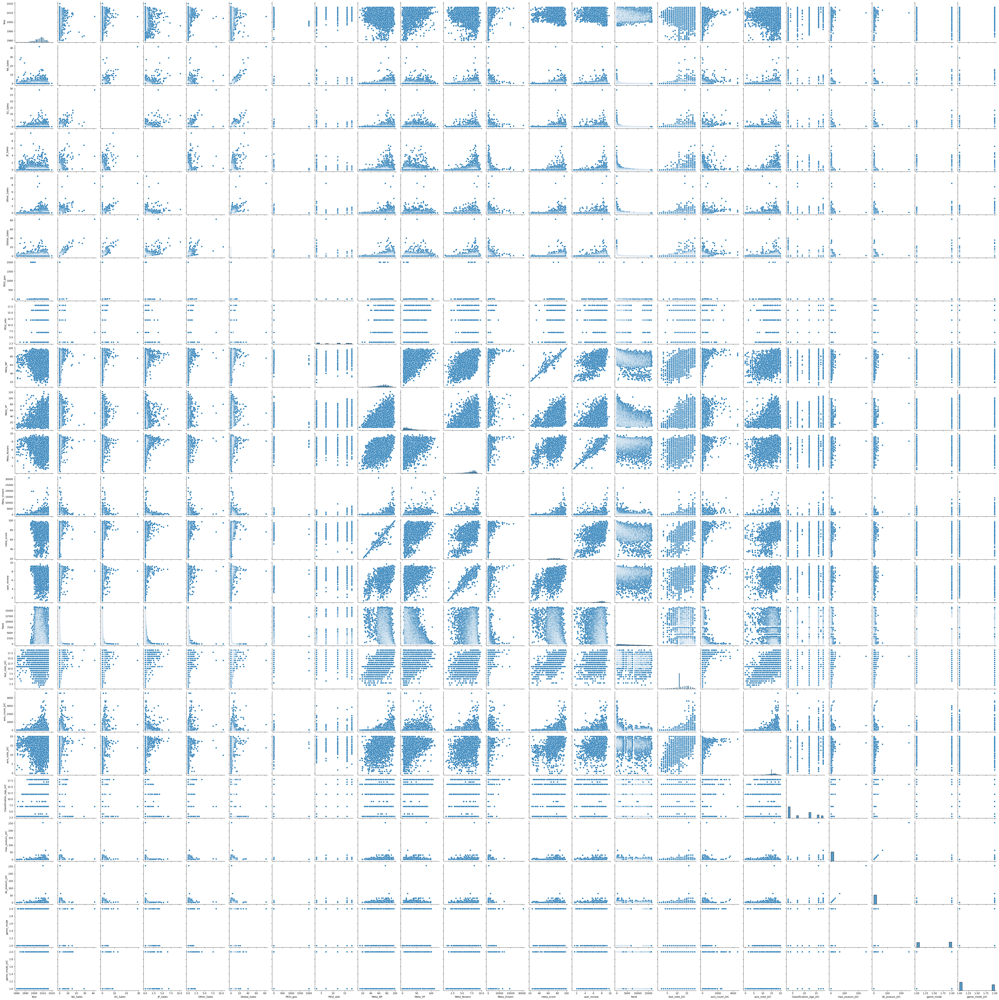

In [26]:
sns.pairplot(df)

C:\Users\debor\AppData\Local\Temp\ipykernel_67476\3135645621.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.clustermap(df.corr())


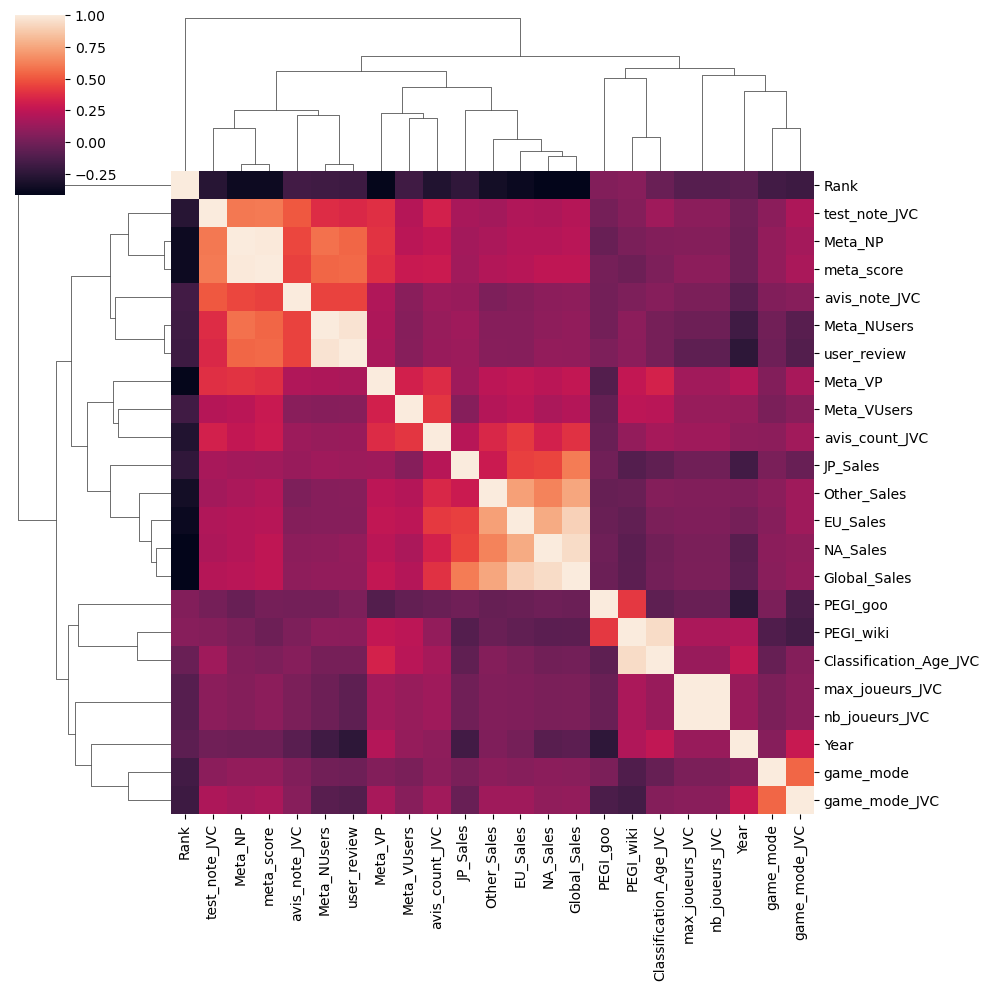

In [27]:
sns.clustermap(df.corr())

## Conclusion Analyse de fond:
- Visualisation de la target(Histogramme si valeur continue/Boxplot si valeur discrète)
- Compréhension des différentes variables (Internet)
- Visualisation des relations features - target (variables continues/continues, continues/discrètes, discrètes/discrètes)
- Identifications des outliers